# Sklopljeni oscilatorji

Sklopljeni Kuramoto oscilatorji so modeli, ki opisujejo **sinhronizacijo nelinearnih nihajnih sistemov** v fizičnih in družbenih kontekstih. To so sistem nihajnih enot, ki so sklopljene preko nekakšne mreže povezav, ki vplivajo na njihovo dinamiko. Vsaka enota ima lastno frekvenco, ki se lahko razlikuje od frekvenc drugih enot, vendar se zaradi sklopitve lahko sinhronizirajo in izkažejo **koordinirano dinamiko**.

Kuramoto model je predlagal japonski matematik **Yoshiki Kuramoto** leta 1975 kot model **sinhronizacije oscilatorjev v bioloških sistemih**. Danes se ta model uporablja v različnih področjih, kot so fizika, biologija, socialne inženirske vede in računalništvo.

Matematična definicija problema sklopljenih Kuramoto oscilatorjev je sledeča:
Naj bodo $N$ oscilatorji s fazami $\theta_1, \theta_2, ..., \theta_N$ in frekvencami $\omega_1, \omega_2, ..., \omega_N$. Dinamika oscilatorja $i$ je opisana z naslednjo diferencialno enačbo:


$$\frac{d \theta_i}{dt} = \omega_i + \frac{k}{N} \sum_{j=1}^{N} \sin(\theta_j-\theta_i)$$

kjer je $K$ sklopitveni parameter, ki določa moč sklopitve med enotami. Sinusni izraz opisuje vpliv drugih enot na dinamiko vsake posamezne enote.
Cilj je najti stabilne rešitve za fazne razlike $\Delta_{ij} = \theta_i - \theta_j$ za vsako kombinacijo oscilatorjev, ki izpolnjujejo pogoj sinhronizacije, ki je definiran kot:

$$\lim_{t \rightarrow \infty} = \Delta_{ij} (t) = 0,$$


kjer je $\Delta_{ij}(t) = \theta_i(t) - \theta_j(t)$ fazna razlika med oscilatorjema $i$ in $j$. Raziskovanje sklopljenih Kuramoto oscilatorjev je pomembno, saj lahko pomaga razumeti, kako se sinhronizacija pojavi v različnih sistemih, kot so možganske mreže, celične avtomate in socialne mreže. Poleg tega se uporablja tudi v računalniški znanosti, na primer pri optimizaciji procesov distribuirane obdelave podatkov.

## Branje:
- [Difuzivna sklopitev](https://www.sciencedirect.com/science/article/abs/pii/S0960077914001441?via%3Dihub)

- [Rulkova mapa](https://www.frontiersin.org/articles/10.3389/fphys.2019.00869/full)

- [Kuramoto oscilatorji](https://pubs.aip.org/aip/cha/article/32/9/093119/2835941/A-global-synchronization-theorem-for-oscillators)

- [Naključni mrežni model](https://networkx.org/documentation/stable/reference/generated/networkx.generators.random_graphs.erdos_renyi_graph.html)

In [3]:
import numpy as np
from numpy import random
import networkx as nx
%matplotlib inline
from matplotlib import pyplot as plt
from matplotlib.animation import FuncAnimation
from tqdm.auto import tqdm,trange
from IPython.display import clear_output

In [4]:
def coupling_2(theta, A, eps, N):
    c=np.zeros(N)
    for i in range(N):
        for j in range(N):
            if A[i,j] == 1:
                c[i] += np.sin(theta[j] - theta[i])
        c[i]=eps*c[i]
    return c
                
    c=(A@np.sin(theta-theta[:,np.newaxis]).sum(axis=1)).A[0]
    cc=(eps * A.sum(axis=1) / N).T.A[0]
    return c*cc

def coupling(theta, A, eps, N):
    print("theta",theta.shape,"A",A.shape,"eps",eps,"N",N)
    c = (A @ np.sin(theta - theta.reshape(N, 1))).sum(axis=1)
    return c*eps

def compute_order_parameter(theta):
    N = len(theta)
    r = np.abs(np.mean(np.exp(1j*theta)))
    return r

def simumaltion(N, tmax, dt, A, eps, t, w, theta, plot=False,norm=False):
    #print(theta.shape, w.shape, t.shape)
    # Funkcija za izračun sklopitev

    # Simulate the system
    theta_hist = np.zeros((len(t), N))
    theta_hist[0] = theta
    for i in trange (1, len(t)):
        k1 = dt * (coupling_2(theta, A, eps, N) + w)
        k2 = dt * (coupling_2(theta + k1/2, A, eps, N) + w)
        k3 = dt * (coupling_2(theta + k2/2, A, eps, N) + w)
        k4 = dt * (coupling_2(theta + k3, A, eps, N) + w)
        theta = (theta + (1/6)*(k1 + 2*k2 + 2*k3 + k4))
        if norm:
            theta=theta %(2*np.pi)
            theta_hist[i,:] = theta
        else:
            theta_hist[i,:] = theta
        
        #dtheta = w + coupling_2(theta, A, eps, N)
        #theta = theta + dt * dtheta
        #theta_hist[i] = theta
        
    r_hist = np.zeros(len(t))
    for i in range(len(t)):
        r_hist[i] = compute_order_parameter(theta_hist[i])
    if plot:
        fig, ax = plt.subplots(1, 3, figsize=(17,5), dpi=99)

        ax[0].imshow(A,interpolation='none',cmap='Greys',origin='lower')
        ax[0].set_xticks([i for i in range(0,A.shape[0],10)])
        ax[0].set_yticks([i for i in range(0,A.shape[0],10)])
        ax[0].set_xticklabels([str(i) for i in range(0,A.shape[0],10)], fontsize=6)
        ax[0].set_yticklabels([str(i) for i in range(0,A.shape[1],10)], fontsize=6)
        
        # Plot the results
        for i in range(N):
            ax[1].plot(t, theta_hist[:, i])
        ax[1].set_xlabel('Time')
        ax[1].set_ylabel('Phase')
        
        # Plot order parameter over time
        ax[2].plot(t, r_hist)
        ax[2].set_xlabel('Time')
        ax[2].set_ylabel('Order parameter')
        plt.show()
    return theta_hist,np.mean(r_hist)

In [10]:
#Parametri simulacije
N = 100   # Število oscilatorjev
k_avg=10   # Povprečno število sosedov
eps= 0.5  # Sklopitev
dt = 0.001   # Integracijski korak
tmax = 1   # Čas trajanja simulacije
theta = np.random.uniform(0, 2*np.pi, N)    # Začete faze oscilatorjev
w = np.random.normal(0, 1, N)   # Lastne frekvence oscilatorjev
periode=np.random.normal(loc=2, scale=1, size=N)
w = 2*np.pi/periode
t = np.arange(0, tmax, dt)     # Polje časovnih točk


#Ustvarimo mrežo
G = nx.erdos_renyi_graph(N, k_avg/N)
print(f"k_avg = {np.mean([G.degree(i) for i in range(N)]):.2f}")

#G pretvorimo v matriko sosednjosti A
A = nx.to_numpy_matrix(G)

theta_hist,r=simumaltion(N, tmax, dt, A, eps, t, w, theta,plot=True)

k_avg = 10.82
simulation theta (100,) A (100, 100) eps 0.5 N 100


  0%|          | 0/999 [00:00<?, ?it/s]

In [9]:
res_dict={}
for ieps in range(0,100,10):
    eps=ieps/100
    theta_hist,r=simumaltion(N, tmax, dt, A, eps, t, w, theta,plot=False)
    clear_output(wait=True)
    res_dict[eps]=r
    for key in res_dict.keys():
        print(f"eps = {key} | |r| = {res_dict[key]}")

eps = 0.0 | |r| = 0.08809146290239282
eps = 0.1 | |r| = 0.11323877121649178
eps = 0.2 | |r| = 0.2276022517761358
eps = 0.3 | |r| = 0.3741327191057583
eps = 0.4 | |r| = 0.5052596064756055
eps = 0.5 | |r| = 0.5990380332616526
eps = 0.6 | |r| = 0.6715742047199992
eps = 0.7 | |r| = 0.7146802980287941
eps = 0.8 | |r| = 0.7436336200778929
eps = 0.9 | |r| = 0.7661825458062742


In [ ]:
def update_plot(i):
    ax.clear()
    ax.set_xlim(-1.2, 1.2)
    ax.set_ylim(-1.2, 1.2)
    ax.set_aspect('equal')
    ax.set_title(f'Time = {i*dt:.2f}')
    # Compute positions of oscillator points on unit circle
    x = np.cos(theta_hist[i,:])
    y = np.sin(theta_hist[i,:])
    # Plot oscillator points
    ax.scatter(x, y, color='blue', s=50)
    # Plot edges between connected oscillators
    for edge in G.edges():
        ax.plot([x[edge[0]], x[edge[1]]], [y[edge[0]], y[edge[1]]], color='gray')

  0%|          | 0/100 [00:00<?, ?it/s]

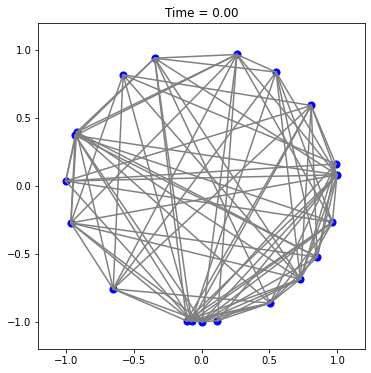

In [141]:
# Set up plot
fig, ax = plt.subplots(figsize=(6,6))

# Create animation
ani = FuncAnimation(fig, update_plot, frames=trange(0,100,1), interval=100)
from IPython.display import HTML
HTML(ani.to_jshtml())

In [ ]:
A@w[0:10,np.newaxis]

matrix([[-1.34451483e+00],
        [ 6.19541008e-01],
        [ 3.52649962e+00],
        [ 2.25163647e+00],
        [ 9.37013420e-01],
        [-8.03372100e-01],
        [ 9.62919231e-01],
        [-1.97086070e+00],
        [-7.30744576e-01],
        [ 7.59614219e-01],
        [ 5.09690771e+00],
        [-9.30395068e-01],
        [-3.22216143e-02],
        [-1.78828088e+00],
        [ 4.25503852e-01],
        [-2.69342150e+00],
        [-1.14374051e+00],
        [-1.95865101e+00],
        [-4.62299713e-01],
        [-3.11765356e+00],
        [ 4.88312831e+00],
        [-7.12355778e-01],
        [-2.75491587e+00],
        [ 1.18782233e-01],
        [-2.79430606e+00],
        [-1.93278755e+00],
        [ 2.66272794e+00],
        [ 1.79776992e+00],
        [ 2.09156272e-01],
        [ 1.38345209e+00],
        [-6.62138299e-01],
        [-2.45302018e+00],
        [-2.08535769e+00],
        [-1.13908475e+00],
        [-2.24064683e+00],
        [ 1.77892327e-01],
        [ 1.07018505e+00],
 

In [ ]:
AA=np.array([[1,1,0],[0,1,1],[1,1,1]])
theta=np.array([1,2,3])
print(theta.reshape(3, 1))
xx=theta-theta.reshape(3, 1)
print(xx)
yy=A @ xx
print(yy)
def coupling(theta, A, eps, N):
    print("theta",theta.shape,"A",A.shape,"eps",eps,"N",N)
    c = (A @ np.sin(theta - theta.reshape(N, 1))).sum(axis=1)
    return c*eps

[[1]
 [2]
 [3]]
[[ 0  1  2]
 [-1  0  1]
 [-2 -1  0]]


ValueError: matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 3 is different from 1000)